In [1]:


import glob
import numpy as np
import pandas as pd
import os

import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, log_loss, accuracy_score
from sklearn.model_selection import train_test_split
import random

import cv2
import keras.backend as K
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow.keras.backend as K
from keras import layers
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from keras.layers import *
from keras.models import Model
from skimage import io
from tensorflow.keras.layers import *
%matplotlib inline
import warnings
import seaborn as sns

from sklearn.metrics import accuracy_score
from sklearn.ensemble import VotingClassifier

warnings.filterwarnings('ignore')
sns.set_style('darkgrid')
pd.set_option('display.max_columns', None)

2022-12-20 18:45:10.837747: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-20 18:45:11.349676: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-10.0/lib64/
2022-12-20 18:45:11.349735: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-20 18:45:12.858903: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot op

In [2]:
''' train and test path '''
train_path = './brain tumor dataset/Training/'
test_path = './brain tumor dataset/Testing/'

In [3]:
File=[]
for f in os.listdir(train_path):
    File += [f]

'''  total number of classes '''
print(File)

['meningioma_tumor', 'no_tumor', 'pituitary_tumor', 'glioma_tumor']


In [13]:
''' reading images '''

train_data = []

''' label encoding '''
mapping={'no_tumor':0, 'pituitary_tumor':1, 'meningioma_tumor':2, 'glioma_tumor':3}

count=0

for f in os.listdir(train_path):
    ''' joining path '''
    path = os.path.join(train_path, f)
    for im in os.listdir(path):
        ''' loading an image '''
        img = load_img(os.path.join(path, im), grayscale=False, color_mode='rgb', target_size=(150,150))
        ''' converting an image to array '''
        img = img_to_array(img)
        ''' scaling  '''
        img = img / 255.0
        ''' appending image to train_data '''
        train_data.append([img, count])     
    count=count+1

In [14]:
test_data = []

''' label encoding '''
mapping={'no_tumor':0, 'pituitary_tumor':1, 'meningioma_tumor':2, 'glioma_tumor':3}
count=0

for f in os.listdir(test_path):
    ''' joining path '''
    path=os.path.join(test_path, f)
    for im in os.listdir(path):
        ''' loading an image '''
        img = load_img(os.path.join(path, im), grayscale=False, color_mode='rgb', target_size=(150,150))
        ''' converting an image to array '''
        img = img_to_array(img)
        ''' scaling '''
        img = img/255.0
        ''' appending an image to test_data'''
        test_data.append([img, count])         
    count=count+1

In [15]:
train_images, train_labels = zip(*train_data)
test_images, test_labels = zip(*test_data)

In [16]:
''' converting labels into to_categorical '''
train_labels = to_categorical(train_labels)

''' coverting train_images into numpy array '''
train_images = np.array(train_images)

''' converting train_labesl into numpy array '''
train_labels = np.array(train_labels)

''' shaep of train_images and train_labels '''
print(train_images.shape)
print(train_labels.shape)

(2880, 150, 150, 3)
(2880, 4)


In [17]:
''' converting labels into to_categorical '''
test_labels = to_categorical(test_labels)

''' coverting test_images into numpy array '''
test_images = np.array(test_images)

''' converting train_labesl into numpy array '''
test_labels = np.array(test_labels)

''' shaep of test_images and test_labels '''
print(test_images.shape)
print(test_labels.shape)

(394, 150, 150, 3)
(394, 4)


In [18]:
''' reshaping images '''
train_images = train_images.reshape(-1,150,150,3)
test_images = test_images.reshape(-1,150,150,3)

In [19]:
''' train test split '''
X_train, X_test, y_train, y_test = train_test_split(train_images,train_labels, test_size=0.2,random_state=44)

In [20]:
''' shape of X_train, X_test, y_train, y_test '''
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(2304, 150, 150, 3)
(576, 150, 150, 3)
(2304, 4)
(576, 4)


In [21]:
''' data Augmentation '''
data_aug = ImageDataGenerator(horizontal_flip=True, vertical_flip=True, rotation_range=20, zoom_range=0.2,
                    width_shift_range=0.2, height_shift_range=0.2, shear_range=0.1, fill_mode="nearest")

In [22]:
''' DenseNet201 Model '''
model1 = tf.keras.applications.DenseNet201(input_shape=(150,150,3),include_top=False,weights='imagenet',pooling='avg')

''' freezing layers '''
model1.trainable = False

2022-12-20 18:48:57.123294: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/user30/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/usr/local/cuda-10.0/lib64/
2022-12-20 18:48:57.123550: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/user30/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/usr/local/cuda-10.0/lib64/
2022-12-20 18:48:57.123692: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/user30/anaconda3/lib/pyth

In [23]:
inp = model1.input
''' Hidden Layer '''
x = tf.keras.layers.Dense(128, activation='relu')(model1.output)
''' Classification Layer '''
out = tf.keras.layers.Dense(4, activation='softmax')(x)

''' Model '''
model = tf.keras.Model(inputs=inp, outputs=out)

''' compile the model '''
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [24]:
''' training '''
history = model.fit(data_aug.flow(X_train, y_train, batch_size=32), validation_data=(X_test, y_test), epochs=30)

Epoch 1/30
72/72 [==============================] - 144s 2s/step - loss: 0.8252 - accuracy: 0.6714 - val_loss: 0.5842 - val_accuracy: 0.7934
Epoch 2/30
72/72 [==============================] - 107s 1s/step - loss: 0.4881 - accuracy: 0.8151 - val_loss: 0.4545 - val_accuracy: 0.8420
Epoch 3/30
72/72 [==============================] - 106s 1s/step - loss: 0.4752 - accuracy: 0.8168 - val_loss: 0.4507 - val_accuracy: 0.8333
Epoch 4/30
72/72 [==============================] - 110s 2s/step - loss: 0.4421 - accuracy: 0.8307 - val_loss: 0.4270 - val_accuracy: 0.8403
Epoch 5/30
72/72 [==============================] - 108s 2s/step - loss: 0.4261 - accuracy: 0.8333 - val_loss: 0.4661 - val_accuracy: 0.8108
Epoch 6/30
72/72 [==============================] - 108s 1s/step - loss: 0.3824 - accuracy: 0.8442 - val_loss: 0.6076 - val_accuracy: 0.8021
Epoch 7/30
72/72 [==============================] - 104s 1s/step - loss: 0.3659 - accuracy: 0.8559 - val_loss: 0.3982 - val_accuracy: 0.8472
Epoch 8/30
72

In [25]:
''' prediction '''
y_pred=model.predict(X_test)

''' retreiving max val from predicted values '''
pred = np.argmax(y_pred,axis=1)

''' retreiving max val from actual values '''
ground = np.argmax(y_test,axis=1)

''' classificaion report '''
print(classification_report(ground,pred))

18/18 [==============================] - 29s 1s/step
              precision    recall  f1-score   support

           0       0.89      0.65      0.75       158
           1       0.82      0.95      0.88        84
           2       0.80      0.97      0.88       167
           3       0.91      0.89      0.90       167

    accuracy                           0.85       576
   macro avg       0.86      0.86      0.85       576
weighted avg       0.86      0.85      0.85       576



In [26]:
''' training accuracy and validation accuracy graph '''
epochs = range(len(get_acc))
plt.plot(epochs, history.history['accuracy'], 'r', label='Accuracy of Training data')
plt.plot(epochs, history.history['val_accuracy'], 'b', label='Accuracy of Validation data')
plt.title('Training vs validation accuracy')
plt.legend(loc=0)
plt.figure()
plt.show()

NameError: name 'get_acc' is not defined

In [ ]:
''' training loss and validation loss graph '''
epochs = range(len(get_loss))
plt.plot(epochs, history.history['loss'], 'r', label='Loss of Training data')
plt.plot(epochs, history.history['val_loss'], 'b', label='Loss of Validation data')
plt.title('Training vs validation loss')
plt.legend(loc=0)
plt.figure()
plt.show()

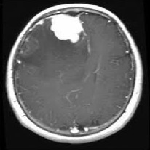

In [27]:
''' loading an image '''
load_img("./brain tumor dataset/Testing/meningioma_tumor/image(112).jpg",target_size=(150,150))

In [28]:
''' predicion on new data '''

''' loading an image '''
img = load_img("./brain tumor dataset/Testing/meningioma_tumor/image(112).jpg",target_size=(150,150))

''' converting img to array '''
img = img_to_array(img) 

''' scaling '''
img = img / 255.0

''' expanding dimensions '''
img = np.expand_dims(img, axis=0)

In [30]:
lbl_encoding = {0:'no_tumor', 1:'pituitary_tumor', 2:'meningioma_tumor', 3:'glioma_tumor'}

def map_label(val):
    return lbl_encoding[val]

''' predicion '''
pred = model.predict(img)

''' retreiving max val from predited values'''
val = np.argmax(pred)
map_val  = map_label(val)

print("Prediction is {}.".format(map_val))

1/1 [==============================] - 7s 7s/step
Prediction is no_tumor.


In [31]:
''' checing shape of test_images '''
print(test_images.shape)

''' predicion on test_images '''
preds2 = model.predict(test_images)

''' checking shape of predicted value'''
print(preds2.shape)

prediction = []
for p in preds2:
    ''' retreiving max val'''
    val2 = np.argmax(p)      
    prediction += [val2]

(394, 150, 150, 3)
13/13 [==============================] - 15s 1s/step
(394, 4)


In [34]:
actual2 = test_labels

In [39]:
data = pd.read_csv('./kaggle_3m/data.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [40]:
data.head(10)


,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0
5,TCGA_CS_5395,2.0,4.0,2,2.0,NaN,3.0,2,3.0,1.0,1.0,3.0,5.0,2.0,43.0,2.0,NaN,1.0
6,TCGA_CS_5396,3.0,3.0,2,3.0,2.0,2.0,3,3.0,2.0,1.0,3.0,2.0,1.0,53.0,3.0,2.0,0.0
7,TCGA_CS_5397,NaN,4.0,1,2.0,3.0,3.0,2,1.0,2.0,1.0,1.0,6.0,1.0,54.0,3.0,2.0,1.0
8,TCGA_CS_6186,2.0,4.0,1,2.0,1.0,3.0,2,2.0,2.0,1.0,3.0,2.0,2.0,58.0,3.0,2.0,1.0
9,TCGA_CS_6188,2.0,4.0,3,2.0,3.0,3.0,2,1.0,2.0,1.0,3.0,6.0,2.0,48.0,3.0,2.0,0.0


In [41]:
DATA_PATH = "./kaggle_3m/"

# File path line length images for later sorting

BASE_LEN = 89

END_IMG_LEN = 4

END_MASK_LEN = 9


# img size
IMG_SIZE = 256

data_map = []
for sub_dir_path in glob.glob(DATA_PATH+"*"):
    if os.path.isdir(sub_dir_path):
        dirname = sub_dir_path.split("/")[-1]
        for filename in os.listdir(sub_dir_path):
            image_path = sub_dir_path + "/" + filename
            data_map.extend([dirname, image_path])
    else:
        print("This is not a dir:", sub_dir_path)


df = pd.DataFrame({"dirname" : data_map[::2],
                  "path" : data_map[1::2]})
df.head()

This is not a dir: ./kaggle_3m/README.md
This is not a dir: ./kaggle_3m/data.csv


,dirname,path
0,TCGA_CS_4941_19960909,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...
1,TCGA_CS_4941_19960909,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...
2,TCGA_CS_4941_19960909,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...
3,TCGA_CS_4941_19960909,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...
4,TCGA_CS_4941_19960909,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...


In [42]:
df_imgs = df[~df['path'].str.contains("mask")]
df_masks = df[df['path'].str.contains("mask")]
# Data sorting
imgs = sorted(df_imgs["path"].values)
masks = sorted(df_masks["path"].values)
print(imgs)
# Sorting check
idx = random.randint(0, len(imgs)-1)
print("Path to the Image:", imgs[idx], "\nPath to the Mask:", masks[idx])

['./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_10.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_11.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_12.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_13.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_14.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_15.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_16.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_17.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_18.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_19.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_2.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_20.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_21.tif', './kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_22.tif', './kaggle_3

In [43]:
# Final dataframe
print(df_imgs)
brain_df = pd.DataFrame({"patient_id": df_imgs.dirname.values,
                       "image_path": imgs,
                   "mask_path": masks})
def pos_neg_diagnosis(mask_path):
    value = np.max(cv2.imread(mask_path))
    if value > 0 :
        return 1
    else:
        return 0

brain_df['mask'] = brain_df['mask_path'].apply(lambda x: pos_neg_diagnosis(x))
brain_df

                    dirname                                               path
0     TCGA_CS_4941_19960909  ./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...
1     TCGA_CS_4941_19960909  ./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...
3     TCGA_CS_4941_19960909  ./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...
5     TCGA_CS_4941_19960909  ./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...
7     TCGA_CS_4941_19960909  ./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...
...                     ...                                                ...
7847  TCGA_HT_A61B_19991127  ./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...
7849  TCGA_HT_A61B_19991127  ./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...
7851  TCGA_HT_A61B_19991127  ./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...
7853  TCGA_HT_A61B_19991127  ./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...
7856  TCGA_HT_A61B_19991127  ./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...

[3929 rows x 2 columns]


,patient_id,image_path,mask_path,mask
0,TCGA_CS_4941_19960909,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...,0
1,TCGA_CS_4941_19960909,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...,1
2,TCGA_CS_4941_19960909,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...,1
3,TCGA_CS_4941_19960909,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...,1
4,TCGA_CS_4941_19960909,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...,./kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941...,1
...,...,...,...,...
3924,TCGA_HT_A61B_19991127,./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...,./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...,0
3925,TCGA_HT_A61B_19991127,./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...,./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...,0
3926,TCGA_HT_A61B_19991127,./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...,./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...,0
3927,TCGA_HT_A61B_19991127,./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...,./kaggle_3m/TCGA_HT_A61B_19991127/TCGA_HT_A61B...,0


In [44]:
brain_df['mask'].value_counts()

0    2556
1    1373
Name: mask, dtype: int64

In [45]:
import plotly.graph_objects as go  # using plotly to create interactive plots

fig = go.Figure([go.Bar(x=brain_df['mask'].value_counts().index,
                        y=brain_df['mask'].value_counts(),
                        width=[.4, .4]
                       )
                ])
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=4, opacity=0.4
                 )
fig.update_layout(title_text="Mask Count Plot",
                  width=700,
                  height=550,
                  yaxis=dict(
                             title_text="Count",
                             tickmode="array",
                             titlefont=dict(size=20)
                           )
                 )
fig.update_yaxes(automargin=True)
fig.show()

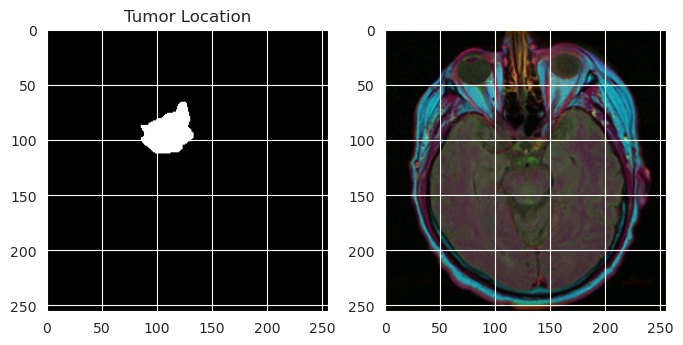

In [46]:
for i in range(len(brain_df)):
    if cv2.imread(brain_df.mask_path[i]).max() > 0:
        break

plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.imshow(cv2.imread(brain_df.mask_path[i]));
plt.title('Tumor Location')

plt.subplot(1,2,2)
plt.imshow(cv2.imread(brain_df.image_path[i]));

In [47]:
cv2.imread(brain_df.mask_path[i]).max(), cv2.imread(brain_df.mask_path[i]).min()

(255, 0)

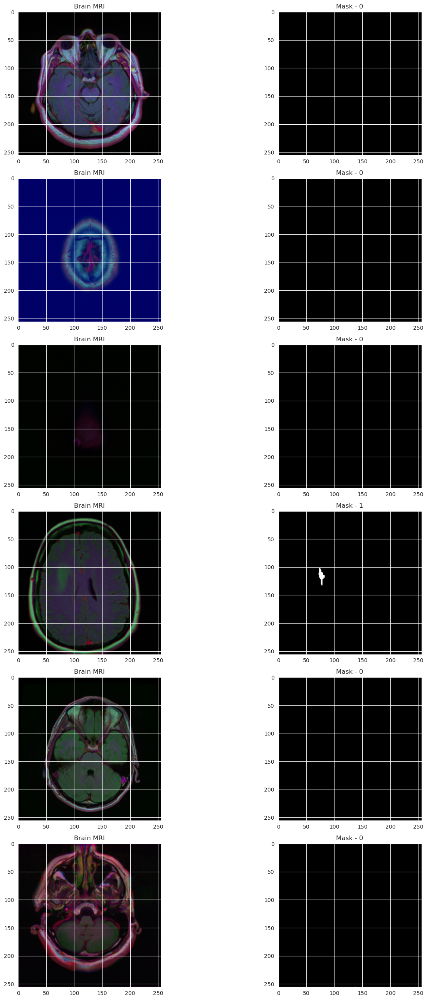

In [48]:
# Basic visualizations: Visualize the images (MRI and Mask) in the dataset separately

fig, axs = plt.subplots(6,2, figsize=(16,26))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(brain_df.image_path[i])) # show MRI
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()

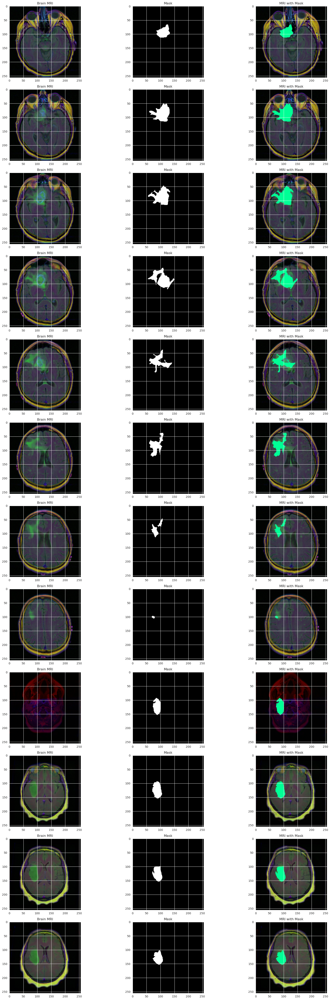

In [49]:
count = 0
i = 0
fig,axs = plt.subplots(12,3, figsize=(20,50))
for mask in brain_df['mask']:
    if (mask==1):
        img = io.imread(brain_df.image_path[i])
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].imshow(img)

        mask = io.imread(brain_df.mask_path[i])
        axs[count][1].title.set_text("Mask")
        axs[count][1].imshow(mask, cmap='gray')

        img[mask==255] = (0,255,150)  # change pixel color at the position of mask
        axs[count][2].title.set_text("MRI with Mask")
        axs[count][2].imshow(img)
        count +=1
    i += 1
    if (count==12):
        break

fig.tight_layout()

In [50]:
brain_df_train = brain_df.drop(columns=['patient_id'])
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [51]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size=0.15)

In [52]:
from keras_preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(rescale=1./255., validation_split=0.1)

train_generator = datagen.flow_from_dataframe(train,
                                              directory='./',
                                              x_col='image_path',
                                              y_col='mask',
                                              subset='training',
                                              class_mode='categorical',
                                              batch_size=16,
                                              shuffle=True,
                                              target_size=(256,256)
                                             )
valid_generator = datagen.flow_from_dataframe(train,
                                              directory='./',
                                              x_col='image_path',
                                              y_col='mask',
                                              subset='validation',
                                              class_mode='categorical',
                                              batch_size=16,
                                              shuffle=True,
                                              target_size=(256,256)
                                             )
test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_dataframe(test,
                                                  directory='./',
                                                  x_col='image_path',
                                                  y_col='mask',
                                                  class_mode='categorical',
                                                  batch_size=16,
                                                  shuffle=False,
                                                  target_size=(256,256)
                                                 )

Found 3006 validated image filenames belonging to 2 classes.
Found 333 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


In [53]:
from tensorflow.keras.applications.resnet50 import ResNet50
clf_model = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=(256,256,3)))
clf_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 64, 64, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [62]:
# before this i tried with trainable layer but the accuracy was less as compared
for layer in clf_model.layers:
    layers.trainable = False

In [63]:
head = clf_model.output
head = AveragePooling2D(pool_size=(4,4))(head)
head = Flatten(name='Flatten')(head)
head = Dense(256, activation='relu')(head)
head = Dropout(0.3)(head)
head = Dense(256, activation='relu')(head)
head = Dropout(0.3)(head)
head = Dense(2, activation='softmax')(head)

model = Model(clf_model.input, head)
model.compile(loss = 'categorical_crossentropy',
              optimizer='adam',
              metrics= ["accuracy"]
             )
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 64, 64, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [64]:
earlystopping = EarlyStopping(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=15
                             )
checkpointer = ModelCheckpoint(filepath="clf-resnet-weights.hdf5",
                               verbose=1,
                               save_best_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )
callbacks = [checkpointer, earlystopping, reduce_lr]

In [57]:
h = model.fit(train_generator,
              steps_per_epoch= train_generator.n // train_generator.batch_size,
              epochs = 50,
              validation_data= valid_generator,
              validation_steps= valid_generator.n // valid_generator.batch_size,
              callbacks=[checkpointer, earlystopping])

Epoch 1/50
187/187 [==============================] - ETA: 0s - loss: 0.7953 - accuracy: 0.6508
Epoch 1: val_loss improved from inf to 0.66363, saving model to clf-resnet-weights.hdf5
187/187 [==============================] - 1132s 6s/step - loss: 0.7953 - accuracy: 0.6508 - val_loss: 0.6636 - val_accuracy: 0.6594
Epoch 2/50
187/187 [==============================] - ETA: 0s - loss: 0.5542 - accuracy: 0.7047
Epoch 2: val_loss improved from 0.66363 to 0.65303, saving model to clf-resnet-weights.hdf5
187/187 [==============================] - 1085s 6s/step - loss: 0.5542 - accuracy: 0.7047 - val_loss: 0.6530 - val_accuracy: 0.6562
Epoch 3/50
187/187 [==============================] - ETA: 0s - loss: 0.5176 - accuracy: 0.7331
Epoch 3: val_loss improved from 0.65303 to 0.65079, saving model to clf-resnet-weights.hdf5
187/187 [==============================] - 1076s 6s/step - loss: 0.5176 - accuracy: 0.7331 - val_loss: 0.6508 - val_accuracy: 0.6594
Epoch 4/50
187/187 [=====================

In [58]:
# saving model achitecture in json file
model_json = model.to_json()
with open("clf-resnet-model.json", "w") as json_file:
    json_file.write(model_json)

In [59]:
h.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

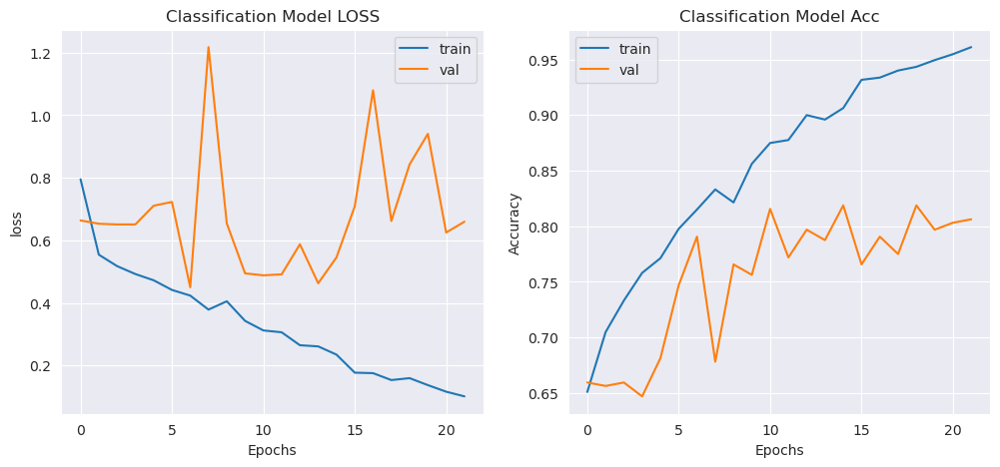

In [60]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(h.history['loss']);
plt.plot(h.history['val_loss']);
plt.title("Classification Model LOSS");
plt.ylabel("loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,2)
plt.plot(h.history['accuracy']);
plt.plot(h.history['val_accuracy']);
plt.title("Classification Model Acc");
plt.ylabel("Accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

In [61]:
_, acc = model.evaluate(test_generator)
print("Test accuracy : {} %".format(acc*100))

37/37 [==============================] - 45s 1s/step - loss: 0.7313 - accuracy: 0.8085
Test accuracy : 80.8474600315094 %


37/37 [==============================] - 48s 1s/step
0.4101694915254237
              precision    recall  f1-score   support

           0       0.91      0.10      0.19       384
           1       0.37      0.98      0.54       206

    accuracy                           0.41       590
   macro avg       0.64      0.54      0.36       590
weighted avg       0.72      0.41      0.31       590



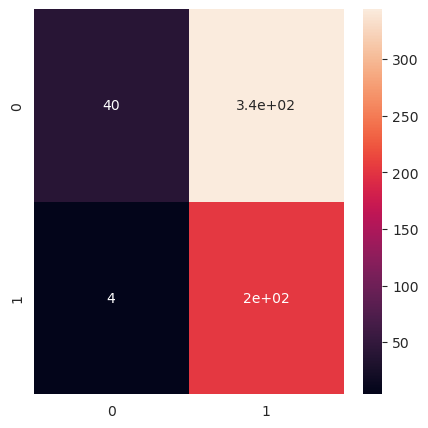

In [65]:
prediction = model.predict(test_generator)

pred = np.argmax(prediction, axis=1)
#pred = np.asarray(pred).astype('str')
original = np.asarray(test['mask']).astype('int')

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
accuracy = accuracy_score(original, pred)
print(accuracy)

cm = confusion_matrix(original, pred)

report = classification_report(original, pred, labels = [0,1])
print(report)
plt.figure(figsize = (5,5))
sns.heatmap(cm, annot=True);

In [66]:
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

In [67]:
# creating test, train and val sets
X_train, X_val = train_test_split(brain_df_mask, test_size=0.15)
X_test, X_val = train_test_split(X_val, test_size=0.5)
print("Train size is {}, valid size is {} & test size is {}".format(len(X_train), len(X_val), len(X_test)))

train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

Train size is 1167, valid size is 103 & test size is 103


In [68]:
class DataGenerator(tf.keras.utils.Sequence):
  def __init__(self, ids , mask, image_dir = './', batch_size = 16, img_h = 256, img_w = 256, shuffle = True):

    self.ids = ids
    self.mask = mask
    self.image_dir = image_dir
    self.batch_size = batch_size
    self.img_h = img_h
    self.img_w = img_w
    self.shuffle = shuffle
    self.on_epoch_end()

  def __len__(self):
    'Get the number of batches per epoch'

    return int(np.floor(len(self.ids)) / self.batch_size)

  def __getitem__(self, index):
    'Generate a batch of data'

    #generate index of batch_size length
    indexes = self.indexes[index* self.batch_size : (index+1) * self.batch_size]

    #get the ImageId corresponding to the indexes created above based on batch size
    list_ids = [self.ids[i] for i in indexes]

    #get the MaskId corresponding to the indexes created above based on batch size
    list_mask = [self.mask[i] for i in indexes]


    #generate data for the X(features) and y(label)
    X, y = self.__data_generation(list_ids, list_mask)

    #returning the data
    return X, y

  def on_epoch_end(self):
    'Used for updating the indices after each epoch, once at the beginning as well as at the end of each epoch'

    #getting the array of indices based on the input dataframe
    self.indexes = np.arange(len(self.ids))

    #if shuffle is true, shuffle the indices
    if self.shuffle:
      np.random.shuffle(self.indexes)

  def __data_generation(self, list_ids, list_mask):
    'generate the data corresponding the indexes in a given batch of images'

    # create empty arrays of shape (batch_size,height,width,depth)
    #Depth is 3 for input and depth is taken as 1 for output becasue mask consist only of 1 channel.
    X = np.empty((self.batch_size, self.img_h, self.img_w, 3))
    y = np.empty((self.batch_size, self.img_h, self.img_w, 1))

    #iterate through the dataframe rows, whose size is equal to the batch_size
    for i in range(len(list_ids)):
      #path of the image
      img_path = str(list_ids[i])

      #mask path
      mask_path = str(list_mask[i])

      #reading the original image and the corresponding mask image
      img = io.imread(img_path)
      mask = io.imread(mask_path)

      #resizing and coverting them to array of type float64
      img = cv2.resize(img,(self.img_h,self.img_w))
      img = np.array(img, dtype = np.float64)

      mask = cv2.resize(mask,(self.img_h,self.img_w))
      mask = np.array(mask, dtype = np.float64)

      #standardising
      img -= img.mean()
      img /= img.std()

      mask -= mask.mean()
      mask /= mask.std()

      #Adding image to the empty array
      X[i,] = img

      #expanding the dimnesion of the image from (256,256) to (256,256,1)
      y[i,] = np.expand_dims(mask, axis = 2)

    #normalizing y
    y = (y > 0).astype(int)

    return X, y

train_data = DataGenerator(train_ids, train_mask)
val_data = DataGenerator(val_ids, val_mask)

In [69]:
# lets create model now
def resblock(X, f):
    '''
    function for creating res block
    '''
    X_copy = X  #copy of input

    # main path
    X = Conv2D(f, kernel_size=(1,1), kernel_initializer='he_normal')(X)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)

    X = Conv2D(f, kernel_size=(3,3), padding='same', kernel_initializer='he_normal')(X)
    X = BatchNormalization()(X)

    # shortcut path
    X_copy = Conv2D(f, kernel_size=(1,1), kernel_initializer='he_normal')(X_copy)
    X_copy = BatchNormalization()(X_copy)

    # Adding the output from main path and short path together
    X = Add()([X, X_copy])
    X = Activation('relu')(X)

    return X

def upsample_concat(x, skip):
    '''
    funtion for upsampling image
    '''
    X = UpSampling2D((2,2))(x)
    merge = Concatenate()([X, skip])

    return merge

In [70]:
input_shape = (256,256,3)
X_input = Input(input_shape) #iniating tensor of input shape

# Stage 1
conv_1 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(X_input)
conv_1 = BatchNormalization()(conv_1)
conv_1 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv_1)
conv_1 = BatchNormalization()(conv_1)
pool_1 = MaxPool2D((2,2))(conv_1)

# stage 2
conv_2 = resblock(pool_1, 32)
pool_2 = MaxPool2D((2,2))(conv_2)

# Stage 3
conv_3 = resblock(pool_2, 64)
pool_3 = MaxPool2D((2,2))(conv_3)

# Stage 4
conv_4 = resblock(pool_3, 128)
pool_4 = MaxPool2D((2,2))(conv_4)

# Stage 5 (bottle neck)
conv_5 = resblock(pool_4, 256)

# Upsample Stage 1
up_1 = upsample_concat(conv_5, conv_4)
up_1 = resblock(up_1, 128)

# Upsample Stage 2
up_2 = upsample_concat(up_1, conv_3)
up_2 = resblock(up_2, 64)

# Upsample Stage 3
up_3 = upsample_concat(up_2, conv_2)
up_3 = resblock(up_3, 32)

# Upsample Stage 4
up_4 = upsample_concat(up_3, conv_1)
up_4 = resblock(up_4, 16)

# final output
out = Conv2D(1, (1,1), kernel_initializer='he_normal', padding='same', activation='sigmoid')(up_4)

seg_model = Model(X_input, out)
seg_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                           

 conv2d_10 (Conv2D)             (None, 32, 32, 128)  8320        ['max_pooling2d_2[0][0]']        
                                                                                                  
 batch_normalization_9 (BatchNo  (None, 32, 32, 128)  512        ['conv2d_9[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_10 (BatchN  (None, 32, 32, 128)  512        ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 add_2 (Add)                    (None, 32, 32, 128)  0           ['batch_normalization_9[0][0]',  
                                                                  'batch_normalization_10[0][0]'] 
          

 batch_normalization_19 (BatchN  (None, 64, 64, 64)  256         ['conv2d_19[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 add_5 (Add)                    (None, 64, 64, 64)   0           ['batch_normalization_18[0][0]', 
                                                                  'batch_normalization_19[0][0]'] 
                                                                                                  
 activation_11 (Activation)     (None, 64, 64, 64)   0           ['add_5[0][0]']                  
                                                                                                  
 up_sampling2d_2 (UpSampling2D)  (None, 128, 128, 64  0          ['activation_11[0][0]']          
                                )                                                                 
          

In [71]:


epsilon = 1e-5
smooth = 1

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

In [72]:
# compling model and callbacks functions
adam = tf.keras.optimizers.Adam(lr = 0.05, epsilon = 0.1)
seg_model.compile(optimizer = adam,
                  loss = focal_tversky,
                  metrics = [tversky]
                 )
#callbacks
earlystopping = EarlyStopping(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=20
                             )
# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="ResUNet-segModel-weights.hdf5",
                               verbose=1,
                               save_best_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )

In [73]:
h = seg_model.fit(train_data,
                  epochs = 60,
                  validation_data = val_data,
                  callbacks = [checkpointer, earlystopping, reduce_lr]
                 )

Epoch 1/60
72/72 [==============================] - ETA: 0s - loss: 0.9517 - tversky: 0.0639
Epoch 1: val_loss improved from inf to 0.95156, saving model to ResUNet-segModel-weights.hdf5
72/72 [==============================] - 398s 5s/step - loss: 0.9517 - tversky: 0.0639 - val_loss: 0.9516 - val_tversky: 0.0640 - lr: 0.0010
Epoch 2/60
72/72 [==============================] - ETA: 0s - loss: 0.9320 - tversky: 0.0895
Epoch 2: val_loss improved from 0.95156 to 0.92511, saving model to ResUNet-segModel-weights.hdf5
72/72 [==============================] - 385s 5s/step - loss: 0.9320 - tversky: 0.0895 - val_loss: 0.9251 - val_tversky: 0.0985 - lr: 0.0010
Epoch 3/60
72/72 [==============================] - ETA: 0s - loss: 0.9026 - tversky: 0.1276
Epoch 3: val_loss improved from 0.92511 to 0.88393, saving model to ResUNet-segModel-weights.hdf5
72/72 [==============================] - 385s 5s/step - loss: 0.9026 - tversky: 0.1276 - val_loss: 0.8839 - val_tversky: 0.1515 - lr: 0.0010
Epoch 4/

Epoch 26/60
72/72 [==============================] - ETA: 0s - loss: 0.4436 - tversky: 0.6600
Epoch 26: val_loss improved from 0.46087 to 0.43441, saving model to ResUNet-segModel-weights.hdf5
72/72 [==============================] - 379s 5s/step - loss: 0.4436 - tversky: 0.6600 - val_loss: 0.4344 - val_tversky: 0.6701 - lr: 0.0010
Epoch 27/60
72/72 [==============================] - ETA: 0s - loss: 0.4390 - tversky: 0.6643
Epoch 27: val_loss did not improve from 0.43441
72/72 [==============================] - 379s 5s/step - loss: 0.4390 - tversky: 0.6643 - val_loss: 0.4467 - val_tversky: 0.6567 - lr: 0.0010
Epoch 28/60
72/72 [==============================] - ETA: 0s - loss: 0.4316 - tversky: 0.6723
Epoch 28: val_loss did not improve from 0.43441
72/72 [==============================] - 377s 5s/step - loss: 0.4316 - tversky: 0.6723 - val_loss: 0.4507 - val_tversky: 0.6518 - lr: 0.0010
Epoch 29/60
72/72 [==============================] - ETA: 0s - loss: 0.4235 - tversky: 0.6796
Epoch 

Epoch 54/60
72/72 [==============================] - ETA: 0s - loss: 0.3280 - tversky: 0.7723
Epoch 54: val_loss did not improve from 0.37336
72/72 [==============================] - 378s 5s/step - loss: 0.3280 - tversky: 0.7723 - val_loss: 0.3806 - val_tversky: 0.7224 - lr: 0.0010
Epoch 55/60
72/72 [==============================] - ETA: 0s - loss: 0.3247 - tversky: 0.7747
Epoch 55: val_loss did not improve from 0.37336
72/72 [==============================] - 378s 5s/step - loss: 0.3247 - tversky: 0.7747 - val_loss: 0.3887 - val_tversky: 0.7142 - lr: 0.0010
Epoch 56/60
72/72 [==============================] - ETA: 0s - loss: 0.3276 - tversky: 0.7712
Epoch 56: val_loss did not improve from 0.37336
72/72 [==============================] - 384s 5s/step - loss: 0.3276 - tversky: 0.7712 - val_loss: 0.3870 - val_tversky: 0.7168 - lr: 0.0010
Epoch 57/60
72/72 [==============================] - ETA: 0s - loss: 0.3290 - tversky: 0.7702
Epoch 57: val_loss did not improve from 0.37336
72/72 [==

In [74]:
# saving model achitecture in json file
seg_model_json = seg_model.to_json()
with open("ResUNet-seg-model.json", "w") as json_file:
    json_file.write(seg_model_json)

In [75]:
h.history.keys()

dict_keys(['loss', 'tversky', 'val_loss', 'val_tversky', 'lr'])

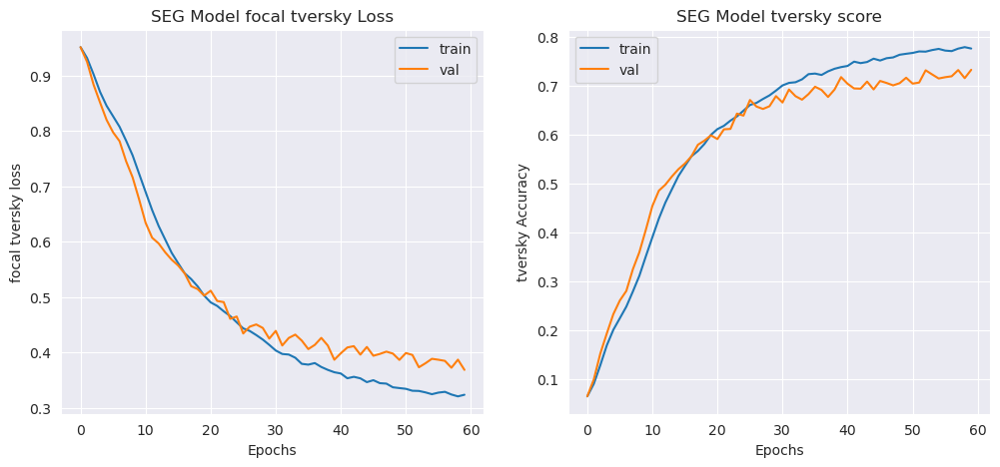

In [76]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(h.history['loss']);
plt.plot(h.history['val_loss']);
plt.title("SEG Model focal tversky Loss");
plt.ylabel("focal tversky loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,2)
plt.plot(h.history['tversky']);
plt.plot(h.history['val_tversky']);
plt.title("SEG Model tversky score");
plt.ylabel("tversky Accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

In [77]:
test_ids = list(X_test.image_path)
test_mask = list(X_test.mask_path)
test_data = DataGenerator(test_ids, test_mask)
_, tv = seg_model.evaluate(test_data)
print("Segmentation tversky is {:.2f}%".format(tv*100))

6/6 [==============================] - 6s 996ms/step - loss: 0.3782 - tversky: 0.7236
Segmentation tversky is 72.36%


In [78]:
def prediction(test, model, model_seg):
    # empty list to store results
    mask, image_id, has_mask = [], [], []

    #itetrating through each image in test data
    for i in test.image_path:

        img = io.imread(i)
        #normalizing
        img = img *1./255.
        img = cv2.resize(img, (256,256))
        img = np.array(img, dtype=np.float64)
        img = np.reshape(img, (1,256,256,3))

        #making prediction for tumor in image
        is_defect = model.predict(img)
        if np.argmax(is_defect)==0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask :)')
            continue

        #Creating a empty array of shape 1,256,256,1
        X = np.empty((1,256,256,3))
        img = io.imread(i)
        img = cv2.resize(img, (256,256))
        img = np.array(img, dtype=np.float64)

        # standardising the image
        img -= img.mean()
        img /= img.std()
        X[0,] = img

        #make prediction of mask
        predict = model_seg.predict(X)

        if predict.round().astype(int).sum()==0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask :)')
        else:
            image_id.append(i)
            has_mask.append(1)
            mask.append(predict)

    return pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})

In [79]:
# making prediction
df_pred = prediction(test, model, seg_model)
df_pred

1/1 [==============================] - 0s 106ms/step


1/1 [==============================] - 0s 191ms/step


1/1 [==============================] - 0s 186ms/step


1/1 [==============================] - 0s 119ms/step


,image_path,predicted_mask,has_mask
0,./kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A...,"[[[[4.037028e-05], [9.406065e-05], [4.3691474e...",1
1,./kaggle_3m/TCGA_DU_7309_19960831/TCGA_DU_7309...,"[[[[3.8397953e-05], [8.963343e-05], [5.579291e...",1
2,./kaggle_3m/TCGA_DU_5854_19951104/TCGA_DU_5854...,No mask :),0
3,./kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010...,"[[[[5.290236e-05], [6.771231e-05], [7.181348e-...",1
4,./kaggle_3m/TCGA_DU_7304_19930325/TCGA_DU_7304...,"[[[[2.5089415e-05], [9.725349e-05], [2.5187273...",1
...,...,...,...
585,./kaggle_3m/TCGA_DU_5854_19951104/TCGA_DU_5854...,No mask :),0
586,./kaggle_3m/TCGA_HT_8563_19981209/TCGA_HT_8563...,No mask :),0
587,./kaggle_3m/TCGA_FG_A60K_20040224/TCGA_FG_A60K...,No mask :),0
588,./kaggle_3m/TCGA_DU_5871_19941206/TCGA_DU_5871...,No mask :),0


In [80]:
# merging original and prediction df
df_pred = test.merge(df_pred, on='image_path')
df_pred.head(10)

,image_path,mask_path,mask,predicted_mask,has_mask
0,./kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A...,./kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A...,1,"[[[[4.037028e-05], [9.406065e-05], [4.3691474e...",1
1,./kaggle_3m/TCGA_DU_7309_19960831/TCGA_DU_7309...,./kaggle_3m/TCGA_DU_7309_19960831/TCGA_DU_7309...,0,"[[[[3.8397953e-05], [8.963343e-05], [5.579291e...",1
2,./kaggle_3m/TCGA_DU_5854_19951104/TCGA_DU_5854...,./kaggle_3m/TCGA_DU_5854_19951104/TCGA_DU_5854...,0,No mask :),0
3,./kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010...,./kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010...,1,"[[[[5.290236e-05], [6.771231e-05], [7.181348e-...",1
4,./kaggle_3m/TCGA_DU_7304_19930325/TCGA_DU_7304...,./kaggle_3m/TCGA_DU_7304_19930325/TCGA_DU_7304...,0,"[[[[2.5089415e-05], [9.725349e-05], [2.5187273...",1
5,./kaggle_3m/TCGA_DU_7013_19860523/TCGA_DU_7013...,./kaggle_3m/TCGA_DU_7013_19860523/TCGA_DU_7013...,1,"[[[[1.6224953e-05], [0.00010801], [4.413891e-0...",1
6,./kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A...,./kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A...,1,"[[[[3.933846e-05], [9.490431e-05], [4.1382413e...",1
7,./kaggle_3m/TCGA_HT_8105_19980826/TCGA_HT_8105...,./kaggle_3m/TCGA_HT_8105_19980826/TCGA_HT_8105...,1,"[[[[2.6247277e-05], [9.563554e-05], [1.717997e...",1
8,./kaggle_3m/TCGA_CS_6669_20020102/TCGA_CS_6669...,./kaggle_3m/TCGA_CS_6669_20020102/TCGA_CS_6669...,1,"[[[[2.1654918e-05], [0.00010646], [1.16861365e...",1
9,./kaggle_3m/TCGA_FG_6690_20020226/TCGA_FG_6690...,./kaggle_3m/TCGA_FG_6690_20020226/TCGA_FG_6690...,0,No mask :),0


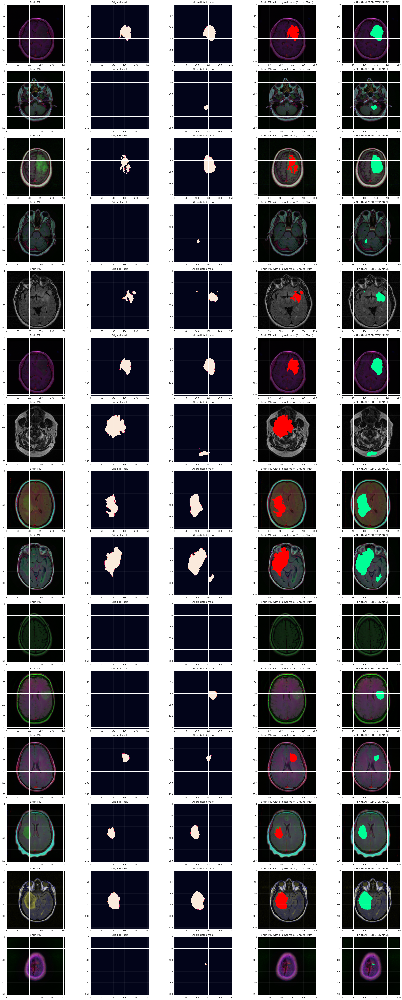

In [81]:
#visualizing prediction
count = 0
fig, axs = plt.subplots(15,5, figsize=(30,70))

for i in range(len(df_pred)):
    if df_pred.has_mask[i]==1 and count<15:
        #read mri images
        img = io.imread(df_pred.image_path[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[count][0].imshow(img)
        axs[count][0].title.set_text('Brain MRI')

        #read original mask
        mask = io.imread(df_pred.mask_path[i])
        axs[count][1].imshow(mask)
        axs[count][1].title.set_text('Original Mask')

        #read predicted mask
        pred = np.array(df_pred.predicted_mask[i]).squeeze().round()
        axs[count][2].imshow(pred)
        axs[count][2].title.set_text('AI predicted mask')

        #overlay original mask with MRI
        img[mask==255] = (255,0,0)
        axs[count][3].imshow(img)
        axs[count][3].title.set_text('Brain MRI with original mask (Ground Truth)')

        img_ = io.imread(df_pred.image_path[i])
        img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
        img_[pred==1] = (0,255,150)
        axs[count][4].imshow(img_)
        axs[count][4].title.set_text('MRI with AI PREDICTED MASK')

        count +=1
    if (count==15):
        break

fig.tight_layout()

In [101]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
import seaborn as sns

from sklearn.metrics import accuracy_score
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

warnings.filterwarnings('ignore')
sns.set_style('darkgrid')
pd.set_option('display.max_columns', None)

In [176]:
train_df = pd.read_csv('../Training2.csv')
''' reading train and test data '''
test_df = pd.read_csv('../Testing2.csv')

In [177]:
''' displaying first five rows of train_df '''
train_df.head()

,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,muscle_wasting,vomiting,burning_micturition,spotting_ urination,fatigue,weight_gain,anxiety,cold_hands_and_feets,mood_swings,weight_loss,restlessness,lethargy,irregular_sugar_level,high_fever,sunken_eyes,sweating,indigestion,headache,dark_urine,nausea,loss_of_appetite,pain_behind_the_eyes,back_pain,constipation,abdominal_pain,diarrhoea,mild_fever,yellow_urine,acute_liver_failure,fluid_overload,swelling_of_stomach,swelled_lymph_nodes,malaise,blurred_and_distorted_vision,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,weakness_in_limbs,fast_heart_rate,pain_during_bowel_movements,bloody_stool,neck_pain,dizziness,cramps,bruising,obesity,swollen_legs,swollen_blood_vessels,puffy_face_and_eyes,brittle_nails,swollen_extremeties,excessive_hunger,drying_and_tingling_lips,slurred_speech,knee_pain,hip_joint_pain,muscle_weakness,stiff_neck,swelling_joints,movement_stiffness,spinning_movements,loss_of_balance,unsteadiness,weakness_of_one_body_side,loss_of_smell,bladder_discomfort,continuous_feel_of_urine,passage_of_gases,internal_itching,toxic_look_(typhos),depression,irritability,muscle_pain,altered_sensorium,red_spots_over_body,abnormal_menstruation,dischromic _patches,watering_from_eyes,increased_appetite,polyuria,family_history,mucoid_sputum,rusty_sputum,lack_of_concentration,visual_disturbances,receiving_blood_transfusion,receiving_unsterile_injections,coma,stomach_bleeding,distention_of_abdomen,history_of_alcohol_consumption,fluid_overload.1,blood_in_sputum,prominent_veins_on_calf,palpitations,painful_walking,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,tumor
0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [157]:
''' displaying first five rows of test_df '''
test_df.head()
test_df.head()

,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,muscle_wasting,vomiting,burning_micturition,spotting_ urination,fatigue,weight_gain,anxiety,cold_hands_and_feets,mood_swings,weight_loss,restlessness,lethargy,irregular_sugar_level,high_fever,sunken_eyes,sweating,indigestion,headache,dark_urine,nausea,loss_of_appetite,pain_behind_the_eyes,back_pain,constipation,abdominal_pain,diarrhoea,mild_fever,yellow_urine,acute_liver_failure,fluid_overload,swelling_of_stomach,swelled_lymph_nodes,malaise,blurred_and_distorted_vision,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,weakness_in_limbs,fast_heart_rate,pain_during_bowel_movements,bloody_stool,neck_pain,dizziness,cramps,bruising,obesity,swollen_legs,swollen_blood_vessels,puffy_face_and_eyes,brittle_nails,swollen_extremeties,excessive_hunger,drying_and_tingling_lips,slurred_speech,knee_pain,hip_joint_pain,muscle_weakness,stiff_neck,swelling_joints,movement_stiffness,spinning_movements,loss_of_balance,unsteadiness,weakness_of_one_body_side,loss_of_smell,bladder_discomfort,continuous_feel_of_urine,passage_of_gases,internal_itching,toxic_look_(typhos),depression,irritability,muscle_pain,altered_sensorium,red_spots_over_body,abnormal_menstruation,dischromic _patches,watering_from_eyes,increased_appetite,polyuria,family_history,mucoid_sputum,rusty_sputum,lack_of_concentration,visual_disturbances,receiving_blood_transfusion,receiving_unsterile_injections,coma,stomach_bleeding,distention_of_abdomen,history_of_alcohol_consumption,fluid_overload.1,blood_in_sputum,prominent_veins_on_calf,palpitations,painful_walking,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,tumor
0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [158]:
print("Shape of train_df: ", train_df.shape)
print("Shape of test_df: ", test_df.shape)

Shape of train_df:  (4779, 118)
Shape of test_df:  (61, 118)


In [160]:
print("Chekcing null valeus in train_df: ", train_df.isnull().sum().any())
print("Chekcing null values in test_df: ", test_df.isnull().sum().any())

Chekcing null valeus in train_df:  False
Chekcing null values in test_df:  False


In [161]:
''' checking unique catergories '''
train_df['tumor'].unique()

array([1, 0], dtype=int64)

In [162]:
''' checking duplicate rows in test_df'''
test_df[test_df.duplicated()]

,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,muscle_wasting,vomiting,burning_micturition,spotting_ urination,fatigue,weight_gain,anxiety,cold_hands_and_feets,mood_swings,weight_loss,restlessness,lethargy,irregular_sugar_level,high_fever,sunken_eyes,sweating,indigestion,headache,dark_urine,nausea,loss_of_appetite,pain_behind_the_eyes,back_pain,constipation,abdominal_pain,diarrhoea,mild_fever,yellow_urine,acute_liver_failure,fluid_overload,swelling_of_stomach,swelled_lymph_nodes,malaise,blurred_and_distorted_vision,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,weakness_in_limbs,fast_heart_rate,pain_during_bowel_movements,bloody_stool,neck_pain,dizziness,cramps,bruising,obesity,swollen_legs,swollen_blood_vessels,puffy_face_and_eyes,brittle_nails,swollen_extremeties,excessive_hunger,drying_and_tingling_lips,slurred_speech,knee_pain,hip_joint_pain,muscle_weakness,stiff_neck,swelling_joints,movement_stiffness,spinning_movements,loss_of_balance,unsteadiness,weakness_of_one_body_side,loss_of_smell,bladder_discomfort,continuous_feel_of_urine,passage_of_gases,internal_itching,toxic_look_(typhos),depression,irritability,muscle_pain,altered_sensorium,red_spots_over_body,abnormal_menstruation,dischromic _patches,watering_from_eyes,increased_appetite,polyuria,family_history,mucoid_sputum,rusty_sputum,lack_of_concentration,visual_disturbances,receiving_blood_transfusion,receiving_unsterile_injections,coma,stomach_bleeding,distention_of_abdomen,history_of_alcohol_consumption,fluid_overload.1,blood_in_sputum,prominent_veins_on_calf,palpitations,painful_walking,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,tumor
29,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
32,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
37,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
41,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
42,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
48,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
56,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
57,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
58,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [163]:
''' value counts of prognosis '''
train_df.tumor.value_counts()

0    4064
1     715
Name: tumor, dtype: int64

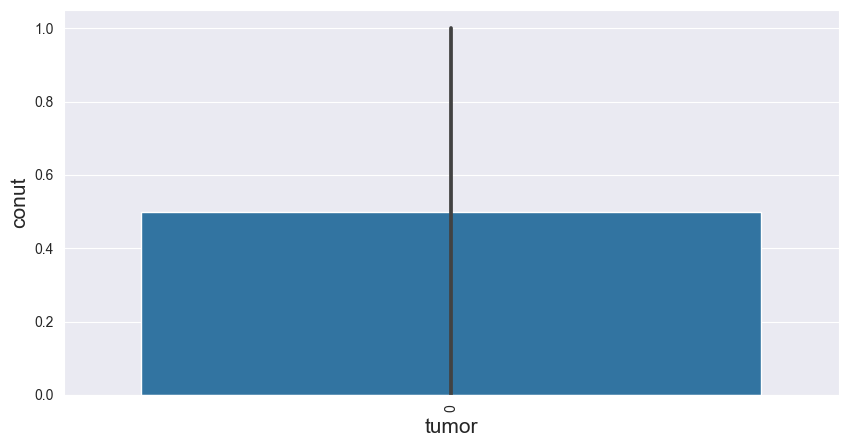

In [138]:
''' barplot plot of prognosis '''
plt.figure(figsize=(10, 5))
plt.xticks(rotation=90)
sns.barplot(train_df.tumor.value_counts().index)
plt.xlabel('tumor', fontsize=15)
plt.ylabel('conut', fontsize=15);

In [139]:
''' column names '''
list(train_df.columns)

['nodal_skin_eruptions',
 'continuous_sneezing',
 'shivering',
 'chills',
 'joint_pain',
 'stomach_pain',
 'acidity',
 'ulcers_on_tongue',
 'muscle_wasting',
 'vomiting',
 'burning_micturition',
 'spotting_ urination',
 'fatigue',
 'weight_gain',
 'anxiety',
 'cold_hands_and_feets',
 'mood_swings',
 'weight_loss',
 'restlessness',
 'lethargy',
 'irregular_sugar_level',
 'high_fever',
 'sunken_eyes',
 'sweating',
 'indigestion',
 'headache',
 'dark_urine',
 'nausea',
 'loss_of_appetite',
 'pain_behind_the_eyes',
 'back_pain',
 'constipation',
 'abdominal_pain',
 'diarrhoea',
 'mild_fever',
 'yellow_urine',
 'acute_liver_failure',
 'fluid_overload',
 'swelling_of_stomach',
 'swelled_lymph_nodes',
 'malaise',
 'blurred_and_distorted_vision',
 'phlegm',
 'throat_irritation',
 'redness_of_eyes',
 'sinus_pressure',
 'runny_nose',
 'congestion',
 'chest_pain',
 'weakness_in_limbs',
 'fast_heart_rate',
 'pain_during_bowel_movements',
 'bloody_stool',
 'neck_pain',
 'dizziness',
 'cramps',
 'br

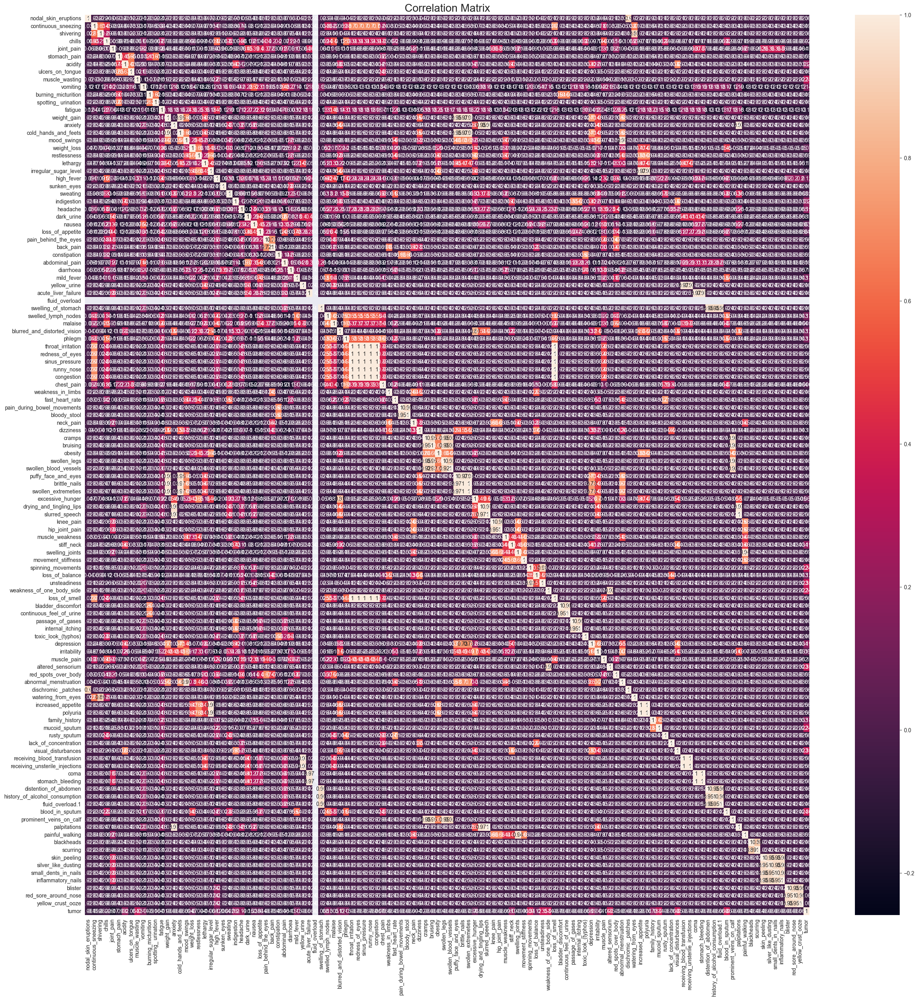

In [119]:

''' Correlation Matrix '''
plt.figure(figsize=(30, 30))
sns.heatmap(train_df.corr(), annot=True)
plt.title('Correlation Matrix', fontsize=20);

In [140]:
''' describing train_df '''
train_df.describe()

,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,muscle_wasting,vomiting,burning_micturition,spotting_ urination,fatigue,weight_gain,anxiety,cold_hands_and_feets,mood_swings,weight_loss,restlessness,lethargy,irregular_sugar_level,high_fever,sunken_eyes,sweating,indigestion,headache,dark_urine,nausea,loss_of_appetite,pain_behind_the_eyes,back_pain,constipation,abdominal_pain,diarrhoea,mild_fever,yellow_urine,acute_liver_failure,fluid_overload,swelling_of_stomach,swelled_lymph_nodes,malaise,blurred_and_distorted_vision,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,weakness_in_limbs,fast_heart_rate,pain_during_bowel_movements,bloody_stool,neck_pain,dizziness,cramps,bruising,obesity,swollen_legs,swollen_blood_vessels,puffy_face_and_eyes,brittle_nails,swollen_extremeties,excessive_hunger,drying_and_tingling_lips,slurred_speech,knee_pain,hip_joint_pain,muscle_weakness,stiff_neck,swelling_joints,movement_stiffness,spinning_movements,loss_of_balance,unsteadiness,weakness_of_one_body_side,loss_of_smell,bladder_discomfort,continuous_feel_of_urine,passage_of_gases,internal_itching,toxic_look_(typhos),depression,irritability,muscle_pain,altered_sensorium,red_spots_over_body,abnormal_menstruation,dischromic _patches,watering_from_eyes,increased_appetite,polyuria,family_history,mucoid_sputum,rusty_sputum,lack_of_concentration,visual_disturbances,receiving_blood_transfusion,receiving_unsterile_injections,coma,stomach_bleeding,distention_of_abdomen,history_of_alcohol_consumption,fluid_overload.1,blood_in_sputum,prominent_veins_on_calf,palpitations,painful_walking,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,tumor
count,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.00000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.0,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.00000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000,4779.000000
mean,0.020925,0.045616,0.021553,0.163214,0.143126,0.046453,0.043733,0.022599,0.018623,0.388157,0.045198,0.022599,0.397573,0.023854,0.023854,0.023854,0.047709,0.092697,0.047709,0.095417,0.023854,0.273488,0.022599,0.13915,0.043733,0.229337,0.119272,0.232685,0.233731,0.025110,0.047709,0.047709,0.211551,0.118016,0.071145,0.023854,0.023854,0.0,0.023854,0.069889,0.143963,0.068843,0.071145,0.025110,0.025110,0.025110,0.025110,0.025110,0.142708,0.022599,0.048964,0.023854,0.023854,0.047709,0.070308,0.023854,0.023854,0.047709,0.023854,0.022599,0.023854,0.025110,0.025110,0.093953,0.023854,0.025110,0.023854,0.023854,0.048964,0.044988,0.047709,0.023854,0.020088,0.068843,0.021134,0.020088,0.025110,0.023854,0.023854,0.023854,0.023854,0.023854,0.046244,0.096464,0.099184

In [141]:
''' describing test_df '''
test_df.describe()

,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,muscle_wasting,vomiting,burning_micturition,spotting_ urination,fatigue,weight_gain,anxiety,cold_hands_and_feets,mood_swings,weight_loss,restlessness,lethargy,irregular_sugar_level,high_fever,sunken_eyes,sweating,indigestion,headache,dark_urine,nausea,loss_of_appetite,pain_behind_the_eyes,back_pain,constipation,abdominal_pain,diarrhoea,mild_fever,yellow_urine,acute_liver_failure,fluid_overload,swelling_of_stomach,swelled_lymph_nodes,malaise,blurred_and_distorted_vision,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,weakness_in_limbs,fast_heart_rate,pain_during_bowel_movements,bloody_stool,neck_pain,dizziness,cramps,bruising,obesity,swollen_legs,swollen_blood_vessels,puffy_face_and_eyes,brittle_nails,swollen_extremeties,excessive_hunger,drying_and_tingling_lips,slurred_speech,knee_pain,hip_joint_pain,muscle_weakness,stiff_neck,swelling_joints,movement_stiffness,spinning_movements,loss_of_balance,unsteadiness,weakness_of_one_body_side,loss_of_smell,bladder_discomfort,continuous_feel_of_urine,passage_of_gases,internal_itching,toxic_look_(typhos),depression,irritability,muscle_pain,altered_sensorium,red_spots_over_body,abnormal_menstruation,dischromic _patches,watering_from_eyes,increased_appetite,polyuria,family_history,mucoid_sputum,rusty_sputum,lack_of_concentration,visual_disturbances,receiving_blood_transfusion,receiving_unsterile_injections,coma,stomach_bleeding,distention_of_abdomen,history_of_alcohol_consumption,fluid_overload.1,blood_in_sputum,prominent_veins_on_calf,palpitations,painful_walking,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,tumor
count,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.0,61.0,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.0,61.0,61.000000,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.0,61.000000,61.0,61.0,61.0,61.0,61.000000,61.000000,61.000000,61.000000
mean,0.032787,0.049180,0.0,0.213115,0.131148,0.049180,0.081967,0.065574,0.016393,0.491803,0.049180,0.0,0.409836,0.016393,0.049180,0.016393,0.016393,0.032787,0.016393,0.065574,0.016393,0.278689,0.016393,0.131148,0.065574,0.262295,0.098361,0.245902,0.180328,0.049180,0.081967,0.016393,0.229508,0.081967,0.016393,0.016393,0.0,0.0,0.049180,0.065574,0.147541,0.081967,0.081967,0.049180,0.049180,0.049180,0.049180,0.049180,0.163934,0.032787,0.049180,0.016393,0.016393,0.049180,0.049180,0.032787,0.032787,0.049180,0.032787,0.016393,0.016393,0.016393,0.016393,0.081967,0.049180,0.049180,0.032787,0.032787,0.032787,0.049180,0.065574,0.016393,0.049180,0.081967,0.032787,0.016393,0.049180,0.049180,0.032787,0.049180,0.049180,0.0,0.032787,0.081967,0.147541,0.016393,0.065574,0.016393,0.032787,0.016393,0.016393,0.016393,0.032787,0.016393,0.049180,0.0,0.016393,0.016393,0.016393,0.0,0.0,0.049180,0.049180,0.032787,0.0,0.032787,0.049180,0.065574,0.0,0.016393,0.0,0.0,0.0,0.0,0.016393,0.016393,0.016393,0.180328
std,0.179556,0.218039,0.0,0.412907,0.340363,0.218039,0.276591,0.2

In [164]:
''' train test split '''
X_train = train_df.iloc[:, :-1].values
y_train = train_df.iloc[:, 117].values

X_test = test_df.iloc[:, :-1].values
y_test = test_df.iloc[:, 117].values

In [165]:
''' Decision Tree '''
dt_clf = DecisionTreeClassifier(splitter='best', criterion='entropy', min_samples_leaf=2)

''' fit on data '''
dt_clf.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', min_samples_leaf=2)

In [166]:
''' prediction '''
pred = dt_clf.predict(X_test)

In [167]:
pd.DataFrame({
    'Actual': y_test,
    'Predicted': pred
}).head(10)

,Actual,Predicted
0,0,0
1,0,0
2,1,1
3,0,0
4,0,0
5,1,0
6,1,0
7,0,0
8,0,0
9,1,1


In [168]:
''' accuracy_score '''
print("Accuracy Score: ", accuracy_score(y_test, pred))

Accuracy Score:  0.9344262295081968


In [169]:
''' Random Forest Classifier '''
rf_clf = RandomForestClassifier(criterion='entropy', min_samples_leaf=2)

''' fit on data '''
rf_clf.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', min_samples_leaf=2)

In [170]:
''' prediction '''
pred_rf = rf_clf.predict(X_test)

In [171]:
''' accuracy_score '''
print("Accuracy Score: ", accuracy_score(y_test, pred_rf))
print("Accuracy Score: ", accuracy_score(y_test, pred_rf))

Accuracy Score:  0.9344262295081968
Accuracy Score:  0.9344262295081968


In [172]:
pd.DataFrame({
    'Actual': y_test,
    'Predicted': pred_rf
}).head(10)

,Actual,Predicted
0,0,0
1,0,0
2,1,1
3,0,0
4,0,0
5,1,0
6,1,0
7,0,0
8,0,0
9,1,1


In [173]:
''' MLP '''
mlp_clf = MLPClassifier()

''' fit on data '''
mlp_clf.fit(X_train, y_train)

MLPClassifier()

In [174]:
''' prediction '''
pred_mlp = mlp_clf.predict(X_test)

In [175]:
''' accuracy_score '''
print("Accuracy Score: ", accuracy_score(y_test, pred_mlp))

Accuracy Score:  0.9344262295081968


In [154]:
pd.DataFrame({
    'Actual': y_test,
    'Predicted': pred_mlp
}).head(10)

,Actual,Predicted
0,0,0
1,0,0
2,1,1
3,0,0
4,0,0
5,1,0
6,1,0
7,0,0
8,0,0
9,1,1


In [117]:
from tensorflow.keras.applications.resnet50 import ResNet50

X = pd.read_csv('./Testing.csv')
Y = data.target

# train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    Y,
                                                    test_size = 0.20,
                                                    random_state = 42)


estimator = []
estimator.append(('DenseNet',
                 tf.keras.applications.DenseNet201(
                     input_shape=(150,150,3),
                     include_top=False,
                     weights='imagenet',
                     pooling='avg')))

estimator.append(('ResuNet', ResNet50(
   weights='imagenet',
   include_top=False,
   input_tensor=Input(
       shape=(256,256,3)))))


estimator.append(('Random Forest', RandomForestClassifier(
    criterion='entropy',
    min_samples_leaf=2)))

# Voting Classifier with hard voting
vot_hard = VotingClassifier(estimators = estimator, voting ='hard')
vot_hard.fit(X_train, y_train)
y_pred = vot_hard.predict(X_test)

# using accuracy_score metric to predict accuracy
score = accuracy_score(y_test, y_pred)

print("Hard Voting Score:",  score, "%")

Hard Voting Score: 96 %
